In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import nltk
from collections import defaultdict
from wordcloud import WordCloud
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from operator import itemgetter
import gc
from sklearn.cluster import KMeans
%load_ext autotime

time: 807 µs (started: 2022-04-14 17:44:00 +05:30)


In [2]:
def acquire_data():
    """ 
    
    Returns: dataset uploaded by the user
    
    """
    filepath= input("Enter dataset path: ")
    data=pd.read_csv(filepath)
    return data


time: 1.26 ms (started: 2022-04-14 17:44:09 +05:30)


In [61]:
#storing the dataset uploaded by the user
df=acquire_data()
df

Enter dataset path: /home/rutvathaker/Downloads/tinder_google_play_reviews.csv


,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt
0,gp:AOqpTOElIsyH7v-Hhhzu6PuI9DIsN7VUcxx0h5SBKpK...,Nikhilesh Verma,https://play-lh.googleusercontent.com/a-/AOh14...,Fake app,1,0,NaN,2022-04-09 11:15:07,NaN,NaN
1,gp:AOqpTOH0smXMRH_GMXoPk0F6hUbPoaQ6e6a29shjEfS...,Tristan Jones,https://play-lh.googleusercontent.com/a/AATXAJ...,"I'm not a racist person, l respect all races b...",2,0,13.5.0,2022-04-09 11:03:58,NaN,NaN
2,gp:AOqpTOFKzNUWcq_qhxzt2Pv8FsukbMOar4kE8f9m2yD...,Lola Racheal,https://play-lh.googleusercontent.com/a/AATXAJ...,I was banned from using the app i don't know w...,1,0,13.5.0,2022-04-09 11:00:09,NaN,NaN
3,gp:AOqpTOF9FSIUVm7b_o1_SJ1p4zi-WpTxBbToccDf5bN...,Boakiller,https://play-lh.googleusercontent.com/a-/AOh14...,Ive been matching with people but they never s...,1,0,13.5.0,2022-04-09 10:54:40,NaN,NaN
4,gp:AOqpTOE9BAQpxA1lZJpmnzmJIaRPxAkhJrXBHA-cF1b...,Maddison Macfarlane,https://play-lh.googleusercontent.com/a-/AOh14...,"Got banned, don't know why or how? There isn't...",1,0,NaN,2022-04-09 10:46:22,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
532706,gp:AOqpTOEBenCXdzF7WTqDqg93-CcQTbXd0Te-U09PVer...,Patrick Mick,https://play-lh.googleusercontent.com/a-/AOh14...,Best app ever finally on android,5,2,1.0,2013-07-15 23:02:49,NaN,NaN
532707,gp:AOqpTOEEOLY8L3njRfwp3aIcYCS5-opukZxFEfUU0aA...,Steven Evans,https://play-lh.googleusercontent.com/a-/AOh14...,Tinder is extremely buggy on the galaxy S4 act...,1,0,1.0,2013-07-15 22:43:41,"Hi Steven, thanks for trying out Tinder! Pleas...",2013-07-30 16:07:32
532708,gp:AOqpTOGWZIFa_iXckzfOuwOF9NsgovyWusXR3Xv53dh...,Curious Minds,https://play-lh.googleusercontent.com/a/AATXAJ...,Keeps crashing.,1,0,1.0,2013-07-15 22:27:15,"Hi, thanks for trying out Tinder! Please updat...",2013-07-30 16:07:41
532709,gp:AOqpTOF1xxymN4l9uyYNQroAS32cD4BSW7qxkpl5GLM...,Wesley Mory,https://play-lh.googleusercontent.com/a/AATXAJ...,Crashes. Doesn't load. Total failure. Take it ...,1,0,1.0,2013-07-15 22:20:31,"Hi Wesley, thanks for trying out Tinder! Pleas...",2013-07-30 16:07:52


time: 5.8 s (started: 2022-04-14 17:51:07 +05:30)


In [62]:
category_features = []
threshold = 20
for each in df.columns:
        if df[each].nunique() < threshold:
            category_features.append(each)
count={}        
for each in category_features:
        df[each] = df[each].astype('category')

time: 812 ms (started: 2022-04-14 17:51:18 +05:30)


In [63]:
def get_summary():
        
    """ 
    
    Returns: dictionary with entire dataset metadata
    
    """
    
    
    data = defaultdict(list)
    data["Rows"].append(df.shape[0])
    data["Columns"].append(df.shape[1])
    data["missing"].append(pd.isnull(df).sum().sum())
    data["unique"].append(df.nunique().sum())
    data["duplicated"].append(df.duplicated().sum())
    return(data)

time: 2.36 ms (started: 2022-04-14 17:51:20 +05:30)


In [64]:
get_summary()

defaultdict(list,
            {'Rows': [532711],
             'Columns': [10],
             'missing': [1079135],
             'unique': [2478913],
             'duplicated': [0]})

time: 1.68 s (started: 2022-04-14 17:51:21 +05:30)


In [65]:
def get_columns_summary():
    
    """ 
    
    Returns: dictionary with column wise metadata
    
    """
    
    
    cols = df.describe(include = "all").to_dict()
    for i in df.columns:
        cols[i]["duplicate"] = df[i].duplicated().sum() 
        cols[i]["null"] = df[i].isnull().sum() 
        cols[i]["nan"] = df[i].isna().sum()
        cols[i]["dtypes"] = df[i].dtypes
    return(cols)

time: 2.15 ms (started: 2022-04-14 17:51:24 +05:30)


In [66]:
get_columns_summary()

{'reviewId': {'count': 532711,
  'unique': 532711,
  'top': 'gp:AOqpTOElIsyH7v-Hhhzu6PuI9DIsN7VUcxx0h5SBKpKFRWs9IrZahCcP2-JtRmBVPhDnnK0vVQS4T_Wddu4Pg7Q',
  'freq': 1,
  'mean': nan,
  'std': nan,
  'min': nan,
  '25%': nan,
  '50%': nan,
  '75%': nan,
  'max': nan,
  'duplicate': 0,
  'null': 0,
  'nan': 0,
  'dtypes': dtype('O')},
 'userName': {'count': 532706,
  'unique': 453304,
  'top': 'A Google user',
  'freq': 36366,
  'mean': nan,
  'std': nan,
  'min': nan,
  '25%': nan,
  '50%': nan,
  '75%': nan,
  'max': nan,
  'duplicate': 79406,
  'null': 5,
  'nan': 5,
  'dtypes': dtype('O')},
 'userImage': {'count': 532711,
  'unique': 496348,
  'top': 'https://play-lh.googleusercontent.com/EGemoI2NTXmTsBVtJqk8jxF9rh8ApRWfsIMQSt2uE4OcpQqbFu7f7NbTK05lx80nuSijCz7sc3a277R67g',
  'freq': 36364,
  'mean': nan,
  'std': nan,
  'min': nan,
  '25%': nan,
  '50%': nan,
  '75%': nan,
  'max': nan,
  'duplicate': 36363,
  'null': 0,
  'nan': 0,
  'dtypes': dtype('O')},
 'content': {'count': 531367

time: 2.32 s (started: 2022-04-14 17:51:27 +05:30)


In [67]:
def box_plot():
    
    """ 
    
    Returns: dictionary with quartiles for plotting box plot of numeric data
    
    """
    outliers=[]
    box_values=df.quantile([0.01, 0.25, 0.5, 0.75, 0.99]) 
    box_values.index=['lwhisker','Q1','Q2','Q3','uwhisker']    
    box_values=box_values.to_dict()
    
    for k, v in box_values.items():
            
        box_values[k]['IQR'] = box_values.get(k).get('Q3')-box_values.get(k).get('Q1')
        box_values[k]['upper_outlier']=box_values.get(k).get('Q3')+(1.5*(box_values.get(k).get('Q3')-box_values.get(k).get('Q1')))
        box_values[k]['lower_outlier']=box_values.get(k).get('Q1')-(1.5*(box_values.get(k).get('Q3')-box_values.get(k).get('Q1')))
   
    return (box_values)
    

time: 911 µs (started: 2022-04-14 17:51:31 +05:30)


In [68]:
box_plot()

{'thumbsUpCount': {'lwhisker': 0.0,
  'Q1': 0.0,
  'Q2': 0.0,
  'Q3': 0.0,
  'uwhisker': 23.0,
  'IQR': 0.0,
  'upper_outlier': 0.0,
  'lower_outlier': 0.0}}

time: 7.79 ms (started: 2022-04-14 17:51:32 +05:30)


In [69]:
def count_plot():
    
        
    """ 
    
    Returns: dictionary with value count of categorical features to plot count plot
    
    """
    
    category_features = []
    threshold = 20
    for each in df.columns:
        if df[each].nunique() < threshold:
            category_features.append(each)
    count={}
    for each in category_features:
        df[each] = df[each].astype('category')
        count[each]=df[each].value_counts().to_dict()
    return(count)


time: 546 µs (started: 2022-04-14 17:51:34 +05:30)


In [70]:
count_plot()

{'score': {1: 199251, 5: 186638, 4: 65460, 3: 43063, 2: 38298, 0: 1}}

time: 753 ms (started: 2022-04-14 17:51:35 +05:30)


In [71]:
def containsNumber(value):
    """ 
    Returns: whether the given character is a digit or not
    
    (called in word_cloud())
    
    """
    for character in value:
            if character.isdigit():
                return True
    return False
    

time: 427 µs (started: 2022-04-14 17:51:37 +05:30)


In [72]:
def word_cloud():
    """
    Returns: dictionary of words from each textual columns for plotting wordclouds
    
    """
    df.dropna(how='any',inplace=True)
    words={}
    for val in df.columns:
        
        if df[val].dtypes == object and type(df[val].values[0])==str:
            words[val]=" ".join(word for word in df[val].values if containsNumber(word)==False and len(word.split())>3)
            

    words=dict(filter(itemgetter(1), words.items()))        
    return(words)

time: 642 µs (started: 2022-04-14 17:51:38 +05:30)


In [73]:
word_cloud()

{'userName': "Man With No Name Ken Li Kim Khiook Naruhito Da Grandaddy of Japan No name no lastname that mexican white guy Milton Baca NKB HEART CLICK Bill Fernando Alfredo Suarez Uzhca Hilary L. Chow FRAS Johann van den berg Trendz By Tammy Hair Salon Ramon Luis Santos Lopez Banin Design & More Raja Shekar Reddy Bandam Sanjeev Jung Gharti Chhetri Jorge S. Sanoja Brown Louie V. aka ActionFigureLV Junkiii Chairman of The Raikoū Clan dogs are better than you american home purchasers m Reckoning Death Defy Soul Onwugbara precious aka EPrince Sue Van Der Ende JHC NSS Volunteer Kaneez Sayyad ToeToe The Siberian Husky Carlton L. H. Burke Christopher van der Kolk It be pretty. Awsome Nothing But Love Entertainment Pedro Henrique de Abreu Sir Peanut Butter the Brave nope don't wan to Winnie Choy Wing Yin Old School Music ft. CRYPTO Sailor Alan At Kraken Kissed Flo's info on crochet braids Wilson Mohd Saiful Adli Abdullah Dominique Bossed Up Jordan Austin de la Fuente Milestone Stop The Clout C

time: 1.22 s (started: 2022-04-14 17:51:39 +05:30)


In [74]:
words=word_cloud()
stopwords = nltk.corpus.stopwords.words('english')  
#tfvectorizer = TfidfVectorizer(stop_words='english')
corpus={}
for val in words.keys():
        corpus[val]=[str(word).lower() for word in words[val].split() if str(word).lower() not in stopwords]
        #tfidf[val]=tfvectorizer.get_feature_names()


time: 3.64 s (started: 2022-04-14 17:51:52 +05:30)


In [75]:
words=word_cloud()
stopwords = nltk.corpus.stopwords.words('english')  
corpus={}
for val in words.keys():
         corpus[val]=[str(word).lower() for word in words[val].split() if str(word).lower() not in stopwords]
       

time: 3.55 s (started: 2022-04-14 17:51:56 +05:30)


In [76]:
def split_dict(d, n):
    keys = list(d.keys())
    for i in range(0, len(keys), n):
        yield {k: d[k] for k in keys[i: i + n]}

time: 1.99 ms (started: 2022-04-14 17:52:01 +05:30)


In [77]:
corp=[]
for item in split_dict(corpus,1):
    corp.append(item)

time: 2.79 ms (started: 2022-04-14 17:52:02 +05:30)


In [78]:
def split_into_df(d):
    for i in range(len(d.keys())):
        #for col in d.keys():
             yield pd.DataFrame(corp[i].items(),columns=['Feature','Words'])

time: 1.46 ms (started: 2022-04-14 17:52:03 +05:30)


In [79]:
df_corp=[]
for item in split_into_df(corpus):
    df_corp.append(item)

time: 3.24 ms (started: 2022-04-14 17:52:03 +05:30)


In [80]:
tfvectorizer=TfidfVectorizer(stop_words='english')

time: 1.18 ms (started: 2022-04-14 17:52:04 +05:30)


In [81]:
vec_df=[]
for i in range(len(df_corp)):
        df_corp[i]=df_corp[i].explode('Words')
        
        tfvectorizer=TfidfVectorizer(stop_words='english')
        vec=tfvectorizer.fit_transform(df_corp[i]['Words'][:10000]).toarray()
        vec_df.append(pd.DataFrame(data=vec,columns=tfvectorizer.get_feature_names()))
        #df_corp[i]['tfidf']=df_corp[i]['Words'].map(vec)
        vec_df[i]=vec_df[i].T
      


/home/rutvathaker/.local/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


time: 285 ms (started: 2022-04-14 17:52:04 +05:30)


In [82]:
X_train=[]
for i in range(len(df_corp)):
    sc=StandardScaler()
    X_train.append(sc.fit_transform(vec_df[i]))
    gc.enable()



time: 478 ms (started: 2022-04-14 17:52:05 +05:30)


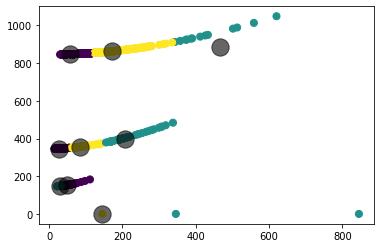

time: 3.86 s (started: 2022-04-14 17:52:06 +05:30)


In [83]:
label=[]
for i in range(len(df_corp)):
    kmeans = KMeans(n_clusters = 3, init = 'k-means++', random_state = 42)
    y_kmeans = kmeans.fit_transform(X_train[i])
    label.append(kmeans.labels_)
    fitted=kmeans.fit(y_kmeans)
    prediction=kmeans.predict(y_kmeans)


    plt.scatter(y_kmeans[:, 0], y_kmeans[:,1],c=prediction,s=50 , cmap='viridis')

    centers2 = fitted.cluster_centers_
    plt.scatter(centers2[:, 0], centers2[:,1],c='black', s=300, alpha=0.6)
    gc.enable()

In [54]:
for i in range(len(df_corp)):
    vec_df[i]['labels']=label[i]
    gc.enable()

time: 14.9 ms (started: 2022-04-14 17:48:43 +05:30)


In [55]:
for i in range(len(df_corp)):
    vec_df[i]=vec_df[i].reset_index().rename(columns={'index':'tfidf_words'})

time: 213 ms (started: 2022-04-14 17:48:44 +05:30)


In [56]:
for i in range(len(df_corp)):
    vec_df[i]=vec_df[i].loc[:,['tfidf_words','labels']]
    vec_df[i].sort_values('labels')

time: 16.3 ms (started: 2022-04-14 17:48:45 +05:30)


In [57]:
vec_df

[     tfidf_words  labels
 0     abandoning       0
 1       abandons       0
 2            abc       0
 3       abdullah       0
 4         abedin       0
 ...          ...     ...
 3883        zika       0
 3884     zionist       0
 3885        zone       0
 3886  zuckerberg       0
 3887      zuesse       0
 
 [3888 rows x 2 columns],
        tfidf_words  labels
 0          abandon       0
 1           abated       0
 2     aberrational       0
 3        abhorrent       0
 4          ability       0
 ...            ...     ...
 3457         young       0
 3458       zakaria       0
 3459          zero       0
 3460        zocalo       0
 3461    zuckerberg       0
 
 [3462 rows x 2 columns]]

time: 20.9 ms (started: 2022-04-14 17:48:46 +05:30)


['title']


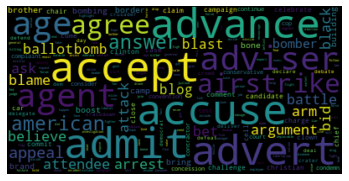

['text']


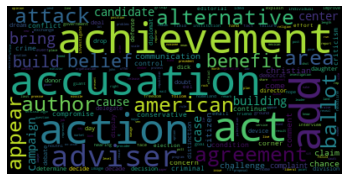

time: 561 ms (started: 2022-04-14 17:49:14 +05:30)


In [60]:
for i in range(len(df_corp)):
    for j in range(0,1):
        print(df_corp[i]['Feature'].unique())
        word=" ".join(line for line in vec_df[i][vec_df[i]['labels']==j].tfidf_words.values)
        WC = WordCloud(max_font_size=50, background_color="Black").generate(word)
        plt.imshow(WC, interpolation = 'bilinear') 
        plt.axis('off')
        plt.show()
        